# Generative Models PHW4: Normalizing Flows

Name: Mohammad Mohammadi

Student ID: 402208592

## Setup

In [1]:
# Import necessary libraries
import os
import random
import numpy as np
from tqdm import trange
import imageio.v2 as imageio
from matplotlib import pyplot as plt
from typing import Callable, Optional, Tuple, Union, List
from IPython.display import Image, display

import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.distributions import MultivariateNormal
from torch.utils.data import DataLoader, TensorDataset


from sklearn.datasets import make_moons, make_circles

In [2]:
# Get cpu, gpu or mps device for training.
device = ("cuda" if torch.cuda.is_available()
          else "mps" if torch.backends.mps.is_available()
          else "cpu")
print(f"Using {device} device")

Using cuda device


In [3]:
# @title visualization helpers

def visualize(flow, epoch, output_dir='frames', device='cpu'):
    # Create directory for saving frames
    os.makedirs(output_dir, exist_ok=True)

    # Visualization of the learned density
    with torch.no_grad():
        # Create a grid over the range of the data
        xline = torch.linspace(-2, 3, 300, device=device)
        yline = torch.linspace(-1, 1.5, 300, device=device)
        xgrid, ygrid = torch.meshgrid(xline, yline, indexing='ij')
        xyinput = torch.cat([xgrid.reshape(-1, 1),
                             ygrid.reshape(-1, 1)], dim=1).to(device)

        # Compute the log probability for each point in the grid
        log_prob_grid = flow.log_prob(xyinput)  # Compute log probs
        zgrid = torch.exp(log_prob_grid).reshape(300, 300).cpu()  # Convert to probability

        # Plot the density
        plt.figure(figsize=(8, 6))
        plt.contourf(
            xgrid.cpu().numpy(),
            ygrid.cpu().numpy(),
            zgrid.numpy(),
            levels=50,
            cmap='viridis'
        )
        plt.title(f'Learned Density at Epoch {epoch}')
        plt.xlabel(r'$x_1$')
        plt.ylabel(r'$x_2$')
        plt.colorbar(label='Density')

        # Save frame as an image
        filename = os.path.join(output_dir, f'frame_{epoch:03d}.png')
        plt.savefig(filename)
        plt.close()

def create_gif(output_dir='frames', gif_name='density_evolution.gif', fps=10):
    images = []
    for frame in sorted(os.listdir(output_dir)):
        if frame.endswith(".png"):
            images.append(imageio.imread(os.path.join(output_dir, frame)))
    imageio.mimsave(gif_name, images, fps=fps)
    display(Image(filename=gif_name))
    return gif_name

# Dataset (5 points)

Create moons using the `make_moons` dataset from `sklearn.datasets`. You must use `TensorDataset` to create a `DataLoader` for this dataset.

In [4]:
# Generate dataset
X, _ = make_moons(n_samples=1000, noise=0.1)
X = torch.tensor(X, dtype=torch.float32)

# DataLoader
dataset = TensorDataset(X)
data_loader = DataLoader(dataset, batch_size=256, shuffle=True)

# Transformations (30 points)

One of the challenges in creating flow models is creating invertible transformations. Also we would like it if computation of their inverse and/or the log determinant of their jacobian were simple.

In [5]:
class Transform(nn.Module):
    """Base class for all transform objects."""

    def forward(self, inputs, context=None):
        raise NotImplementedError()

    def inverse(self, inputs, context=None):
        raise 'InverseNotAvailable'

First we can create a random permutation transform.

In [6]:
class PermutationTransform(Transform):
    def __init__(self, num_features):
        super().__init__()
        self.num_features = num_features
        permutation = torch.randperm(num_features)
        self.register_buffer('permutation', permutation)
        self.register_buffer('inverse_permutation', torch.argsort(permutation))

    def forward(self, inputs, context=None):
        return inputs[:, self.permutation], 0  # Log-det is zero

    def inverse(self, inputs, context=None):
        return inputs[:, self.inverse_permutation]

Now you must:

1. **Scaling and Translation Networks**:
	- Use `self.s_net_factory` and `self.t_net_factory` to initialize the scaling (`s`) and translation (`t`) networks in the `__init__` method.

2. **Forward Pass**:
	-	Pass fixed_inputs through `self.scaling_net` and `self.translation_net` to compute `s` and `t`.

	-	Apply the transformations to `transformed_inputs`.

  - Compute the log-determinant of the Jacobian.

3. **Inverse Pass**:
	-	Solve for `transformed_inputs` by reversing the scaling and translation.

4. **Utility Method **`_initialize_network`:
	-	Use `nn.Sequential`to create a feedforward neural network with the desired hidden dimensions and activation functions.

In [7]:
class CouplingTransform(Transform):
    """
    Implements a coupling layer for a normalizing flow model.
    It splits the input features into two groups based on a binary mask.
    One group remains unchanged while the other is transformed.
    """

    def __init__(
        self,
        mask: Union[torch.Tensor, list, tuple],
        hidden_dims: int,
        s_net_factory: Optional[Callable[[int, int, int], nn.Module]] = None,
        t_net_factory: Optional[Callable[[int, int, int], nn.Module]] = None,
    ):
        """
        Args:
            mask (Union[torch.Tensor, list, tuple]): Binary mask specifying which features to transform.
                * If `mask[i] > 0`, `input[i]` will be transformed.
                * If `mask[i] <= 0`, `input[i]` will remain unchanged.
            hidden_dims (int): Number of hidden units for the coupling neural networks.
            s_net_factory (Callable): Function to create a neural network for the scaling function.
                Must take (input_dim, output_dim, hidden_dims) as arguments.
            t_net_factory (Callable): Function to create a neural network for the translation function.
                Must take (input_dim, output_dim, hidden_dims) as arguments.
        """
        super().__init__()

        # Validate and register the binary mask
        mask = torch.as_tensor(mask, dtype=torch.float32)
        if mask.dim() != 1:
            raise ValueError("Mask must be a 1-dimensional tensor.")
        if mask.numel() == 0:
            raise ValueError("Mask cannot be empty.")
        self.register_buffer('mask', mask)

        # Number of input features
        self.num_features = mask.numel()

        # Validate the network factories
        if not callable(s_net_factory) or not callable(t_net_factory):
            raise ValueError("s_net_factory and t_net_factory must be callable.")

        self.s_net_factory = s_net_factory
        self.t_net_factory = t_net_factory

        # Determine the input/output dimension for the networks:
        # - The "fixed" part is the unmasked features -> input to s,t networks
        # - The "transformed" part is the masked features -> output dimension of s,t networks
        in_dim = int((1 - self.mask).sum().item())
        out_dim = int(self.mask.sum().item())

        # Initialize the scaling (s) and translation (t) networks
        self.scaling_net = self.s_net_factory(in_dim, out_dim, hidden_dims)
        self.translation_net = self.t_net_factory(in_dim, out_dim, hidden_dims)

    def _initialize_network(
        self, input_dim: int, output_dim: int, hidden_dims: int
    ) -> nn.Module:
        """
        Utility method to create a neural network with ReLU activations.
        """
        return nn.Sequential(
            nn.Linear(input_dim, hidden_dims),
            nn.ReLU(),
            nn.Linear(hidden_dims, hidden_dims),
            nn.ReLU(),
            nn.Linear(hidden_dims, output_dim)
        )

    def forward(self, inputs: torch.Tensor, context: Optional[torch.Tensor] = None) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        Forward pass through the coupling transform.
        Returns (z, log_det_J).
        """
        # Validate input dimensions
        if inputs.dim() != 2:
            raise ValueError("Inputs must be a 2D tensor.")
        if inputs.shape[1] != self.num_features:
            raise ValueError(f"Expected {self.num_features} features, but got {inputs.shape[1]}.")

        # Separate fixed part (where mask=0) and transform part (where mask=1)
        # We'll gather columns according to mask
        fixed_part = inputs[:, self.mask < 0.5]       # unmasked features
        transformed_part = inputs[:, self.mask > 0.5] # masked features

        # Compute scaling s and translation t based on the fixed part
        s = self.scaling_net(fixed_part)
        t = self.translation_net(fixed_part)

        # Apply transformation: x_masked -> x_masked * exp(s) + t
        z_transformed = transformed_part * torch.exp(s) + t

        # Combine back to get z
        z = inputs.clone()
        z[:, self.mask > 0.5] = z_transformed

        # log-det-J = sum of s over the transformed dimensions (since we scale those)
        # s has shape [batch_size, out_dim]. We sum across features (dim=1).
        log_det_J = s.sum(dim=1)

        return z, log_det_J

    def inverse(self, inputs: torch.Tensor, context: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Inverse pass through the coupling transform.
        Returns the original x before the transform.
        """
        if inputs.dim() != 2:
            raise ValueError("Inputs must be a 2D tensor.")
        if inputs.shape[1] != self.num_features:
            raise ValueError(f"Expected {self.num_features} features, but got {inputs.shape[1]}.")

        # Separate fixed part and transformed part
        fixed_part = inputs[:, self.mask < 0.5]
        transformed_part = inputs[:, self.mask > 0.5]

        # Compute scaling and translation again (same as forward)
        s = self.scaling_net(fixed_part)
        t = self.translation_net(fixed_part)

        # Invert transformation: z_masked -> (z_masked - t) * exp(-s)
        x_transformed = (transformed_part - t) * torch.exp(-s)

        # Combine back to get x
        x = inputs.clone()
        x[:, self.mask > 0.5] = x_transformed

        return x


# Flows (30 points)

You must:

1.	Forward Pass:
	-	Initialize `log_det_J` to 0.
	-	Iterate over `self.transforms` and apply each transform's forward method.

2.	Inverse Pass:
	-	Iterate through `self.transforms` in reverse order and apply each transform's inverse method.
  - Return the final reconstructed input tensor.

3.	Log-Probability:
	-	Use the forward method to get `z` and `log_det_J`.
	- Compute `log_prob_z` using the base distribution's `log_prob` method.
  - Return `log_prob_z + log_det_J`.

4.	Sampling:
	-	Sample z from the base distribution using `self.base_distribution.sample((num_samples,))`.
	-	Map `z` back to the data space using the inverse method.
	-	Return the generated samples.

5.	Sampling and Log-Probability:
	-	Use the sample method to generate samples.
	-	Use the `log_prob` method to compute log-probabilities for the generated samples.
	-	Return both the samples and their log-probabilities.

In [8]:
class Flow(nn.Module):
    """
    Flow-based model that combines a series of invertible transformations
    with a base distribution for density estimation and sampling.
    """

    def __init__(
        self,
        transforms: List[nn.Module],
        base_distribution: Optional[MultivariateNormal] = None
    ):
        """
        Args:
            transforms (List[nn.Module]): List of invertible transformations (e.g., coupling layers).
            base_distribution (Optional[MultivariateNormal]): The base distribution.
                If None, defaults to a standard multivariate Gaussian.
        """
        super().__init__()
        self.transforms = nn.ModuleList(transforms)
        self.num_features = self.transforms[0].num_features  # assume all transforms have same input size

        if base_distribution is None:
            self.base_distribution = MultivariateNormal(
                loc=torch.zeros(self.num_features, device=device),
                covariance_matrix=torch.eye(self.num_features, device=device)
            )
        else:
            self.base_distribution = base_distribution

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        Forward pass through the flow model.
        Returns (z, log_det_J).
        """
        log_det_J = torch.zeros(x.size(0), device=x.device)
        z = x
        for transform in self.transforms:
            z, ldj = transform.forward(z)
            log_det_J += ldj
        return z, log_det_J

    def inverse(self, z: torch.Tensor) -> torch.Tensor:
        """
        Inverse pass through the flow model.
        Returns x.
        """
        x = z
        # Inverse must be applied in reverse order
        for transform in reversed(self.transforms):
            x = transform.inverse(x)
        return x

    def log_prob(self, x: torch.Tensor) -> torch.Tensor:
        """
        Compute log p(x) under the flow model.
        """
        # 1) Forward pass to get z and log_det_J
        z, log_det_J = self.forward(x)
        # 2) log p(z) from base distribution
        log_prob_z = self.base_distribution.log_prob(z)
        # 3) sum: log p(z) + log_det_J
        return log_prob_z + log_det_J

    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Draw samples from the flow model.
        """
        # 1) Sample from base distribution in latent space
        z = self.base_distribution.sample((num_samples,))
        # 2) Map to x via inverse
        x = self.inverse(z)
        return x

    def sample_and_log_prob(self, num_samples: int) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        Generate samples and their log probabilities under the flow model.
        """
        x = self.sample(num_samples)
        log_prob = self.log_prob(x)
        return x, log_prob


# Masks (10 points)

Now you should:

1.	Generate the Masks:
	-	Loop through num_masks and alternate between masks starting with 0 or 1.

2.	Output Requirements:
	-	Ensure the output is a list of `torch.Tensor` objects.
	-	Each tensor should be of shape `(num_features,)` and should alternate patterns as described.

In [9]:
def create_alternating_masks(num_features: int, num_masks: int) -> List[torch.Tensor]:
    """
    Creates a sequence of alternating binary masks for coupling layers.
    For num_features=2, masks might look like:
    i=0: [0, 1]
    i=1: [1, 0]
    i=2: [0, 1]
    ...
    """
    masks = []
    for i in range(num_masks):
        if i % 2 == 0:
            # e.g., [0,1,0,1,...]
            mask = [ (j % 2) for j in range(num_features) ]
        else:
            # e.g., [1,0,1,0,...]
            mask = [ 1 - (j % 2) for j in range(num_features) ]
        mask = torch.tensor(mask, dtype=torch.float32)
        masks.append(mask)
    return masks


# Training (10 points)

Define the model and it's hyperparameters.

In [41]:
# TODO: Create masks and flow

# For 2D data (like Moons), we have num_features=2
num_features = 2

# Number of coupling layers we want, e.g. 4
num_coupling_layers = 4

# We might want to permute after each coupling to enhance expressivity.
# So total transforms = coupling + permutation repeated
hidden_dims = 64

# We'll create 4 coupling transforms, each followed by a permutation
num_masks = num_coupling_layers  # we want 4 masks
masks = create_alternating_masks(num_features, num_masks)

# Factories for s-net and t-net, each using a small MLP
def s_net_factory(in_dim, out_dim, hidden_dim):
    # For clarity, let's just define a simple MLP:
    return nn.Sequential(
        nn.Linear(in_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, out_dim)
    )

def t_net_factory(in_dim, out_dim, hidden_dim):
    # Same structure
    return nn.Sequential(
        nn.Linear(in_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, out_dim)
    )

transforms = []
for i, mask in enumerate(masks):
    # Coupling
    coupling = CouplingTransform(
        mask=mask,
        hidden_dims=hidden_dims,
        s_net_factory=s_net_factory,
        t_net_factory=t_net_factory
    )
    transforms.append(coupling)
    # Permutation
    perm = PermutationTransform(num_features)
    transforms.append(perm)

# Create the Flow
flow = Flow(transforms).to(device)

# Create an optimizer
optimizer = optim.Adam(flow.parameters(), lr=1e-3)


Now train the model. Make sure you run `visualize(flow, epoch)` at each epoch. (If you don't do this you won't be able to visualize the evolution of your model)

In [42]:
# TODO: Train the model

num_epochs = 400  # You can increase this for better results
output_dir = "frames"

flow.train()
for epoch in range(1, num_epochs+1):
    total_loss = 0.0
    for batch in data_loader:
        x_batch = batch[0].to(device)
        # Negative log likelihood
        loss = -flow.log_prob(x_batch).mean()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item() * x_batch.size(0)
    
    avg_loss = total_loss / len(dataset)
    
    print(f"Epoch [{epoch}/{num_epochs}] - Loss: {avg_loss:.4f}")
    
    # Visualization at each epoch
    visualize(flow, epoch, output_dir=output_dir, device=device)


Epoch [1/400] - Loss: 2.2785
Epoch [2/400] - Loss: 1.9284
Epoch [3/400] - Loss: 1.8327
Epoch [4/400] - Loss: 1.7752
Epoch [5/400] - Loss: 1.7173
Epoch [6/400] - Loss: 1.7080
Epoch [7/400] - Loss: 1.6842
Epoch [8/400] - Loss: 1.6617
Epoch [9/400] - Loss: 1.6467
Epoch [10/400] - Loss: 1.6332
Epoch [11/400] - Loss: 1.6109
Epoch [12/400] - Loss: 1.5903
Epoch [13/400] - Loss: 1.5791
Epoch [14/400] - Loss: 1.5725
Epoch [15/400] - Loss: 1.5583
Epoch [16/400] - Loss: 1.5437
Epoch [17/400] - Loss: 1.5323
Epoch [18/400] - Loss: 1.5218
Epoch [19/400] - Loss: 1.5052
Epoch [20/400] - Loss: 1.5022
Epoch [21/400] - Loss: 1.4972
Epoch [22/400] - Loss: 1.4969
Epoch [23/400] - Loss: 1.4877
Epoch [24/400] - Loss: 1.4726
Epoch [25/400] - Loss: 1.4660
Epoch [26/400] - Loss: 1.4503
Epoch [27/400] - Loss: 1.4426
Epoch [28/400] - Loss: 1.4391
Epoch [29/400] - Loss: 1.4439
Epoch [30/400] - Loss: 1.4424
Epoch [31/400] - Loss: 1.4246
Epoch [32/400] - Loss: 1.4266
Epoch [33/400] - Loss: 1.4301
Epoch [34/400] - Lo

# Visualizations (15 points)

Generate some datapoints using the original distribution and from your model and plot them together.

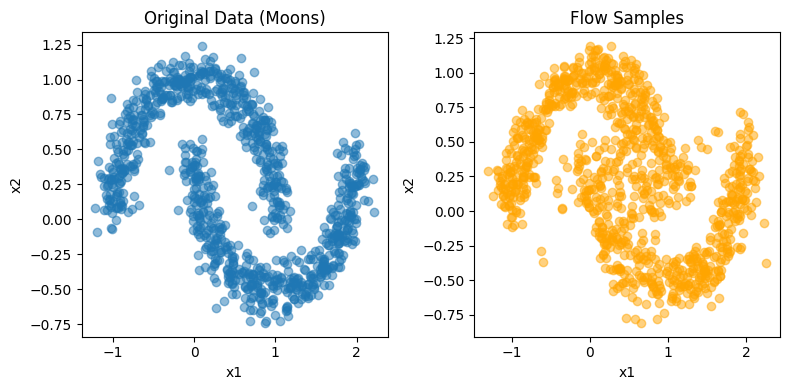

In [43]:
# TODO: Generate and visualize samples
# Generate and visualize samples
flow.eval()
with torch.no_grad():
    # Sample from the flow
    samples = flow.sample(1000).cpu().numpy()

plt.figure(figsize=(8,4))

# Left: Original data
plt.subplot(1, 2, 1)
plt.title("Original Data (Moons)")
plt.scatter(X[:, 0], X[:, 1], alpha=0.5)
plt.xlabel("x1")
plt.ylabel("x2")

# Right: Flow-sampled data
plt.subplot(1, 2, 2)
plt.title("Flow Samples")
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.5, color='orange')
plt.xlabel("x1")
plt.ylabel("x2")

plt.tight_layout()
plt.show()



Visualize the evolution of the Normalizing Flows model.

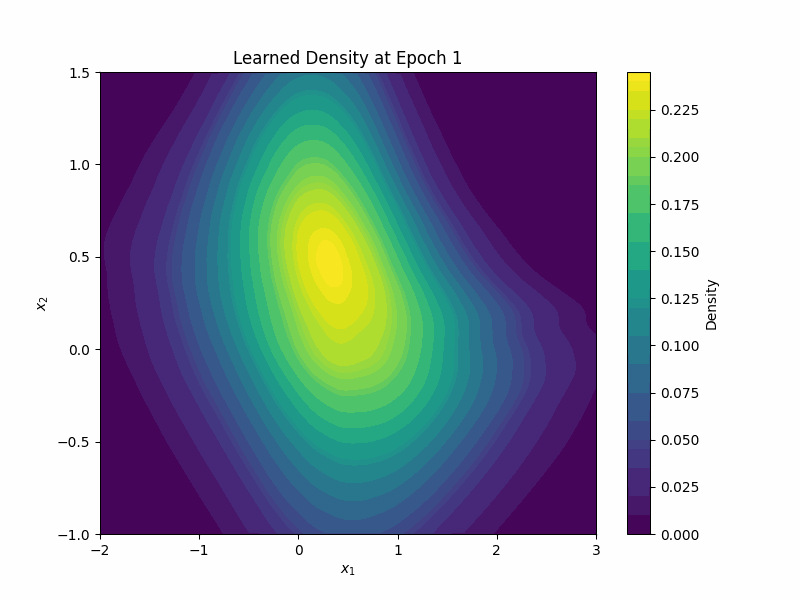

In [44]:
gif_path = create_gif()